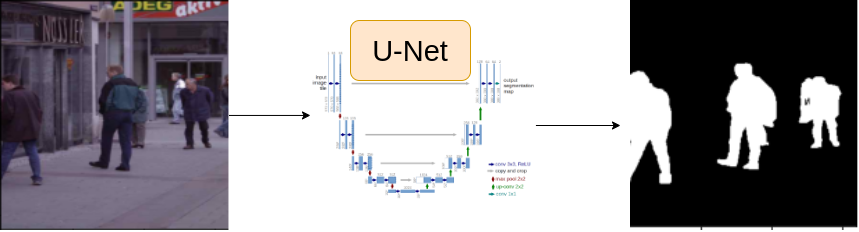

# Set up colab gpu runtime environment

In [1]:
! pip install -Uqq kaggle --force --upgrade

     |████████████████████████████████| 58 kB 2.6 MB/s 
     |████████████████████████████████| 149 kB 8.8 MB/s 
     |████████████████████████████████| 247 kB 30.7 MB/s 
     |████████████████████████████████| 63 kB 1.7 MB/s 
     |████████████████████████████████| 76 kB 5.1 MB/s 
     |████████████████████████████████| 138 kB 47.2 MB/s 
     |████████████████████████████████| 78 kB 7.4 MB/s 
     |████████████████████████████████| 61 kB 9.1 MB/s 
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires requests~=2.23.0, but you have requests 2.27.1 which is incompatible.
google-colab 1.0.0 requires six~=1.15.0, but you have six 1.16.0 which is incompatible.
datascience 0.10.6 requires folium==0.2.1, but you have folium 0.8.3 which is incompatible.
albumentations 0.1.12 requires imgaug<0.2.7,>=0.2.5, but you have imgaug 0.2.9 which is incomp

Need latest for metrics

In [2]:
! pip install -Uqq segmentation-models-pytorch --no-cache-dir

     |████████████████████████████████| 88 kB 5.3 MB/s 
     |████████████████████████████████| 58 kB 15.8 MB/s 
     |████████████████████████████████| 376 kB 11.8 MB/s 


In [3]:
import segmentation_models_pytorch as smp

# Download Dataset


In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
import os
from pathlib import Path
os.environ['KAGGLE_CONFIG_DIR'] = '/content/drive/MyDrive/Colab Notebooks'

# Drone data from TUGraz

https://www.tugraz.at/index.php?id=22387

In [6]:
! kaggle datasets download -d bulentsiyah/semantic-drone-dataset

100% 3.88G/3.89G [02:06<00:00, 13.5MB/s]
100% 3.89G/3.89G [02:06<00:00, 33.1MB/s]


In [7]:
! unzip -q semantic-drone-dataset.zip

# Explore data

In [8]:
import pandas as pd

Pixel values corresponding to the 24 classes.

In [9]:
class_annots = pd.read_csv('/content/class_dict_seg.csv')
class_annots.columns = ['name', 'red', 'green', 'blue']
class_annots

,name,red,green,blue
0,unlabeled,0,0,0
1,paved-area,128,64,128
2,dirt,130,76,0
3,grass,0,102,0
4,gravel,112,103,87
5,water,28,42,168
6,rocks,48,41,30
7,pool,0,50,89
8,vegetation,107,142,35
9,roof,70,70,70


In [10]:
imgs_pth = Path('/content/dataset/semantic_drone_dataset/original_images')
msks_pth = Path('/content/dataset/semantic_drone_dataset/label_images_semantic')

In [11]:
from PIL import Image
from matplotlib import pyplot as plt

In [12]:
idx = 1
img_stem = os.listdir(imgs_pth)[idx][:-3]
img_ = imgs_pth/(img_stem+'jpg')
msk_ = msks_pth/(img_stem+'png')

In [13]:
msk_, img_

(PosixPath('/content/dataset/semantic_drone_dataset/label_images_semantic/071.png'),
 PosixPath('/content/dataset/semantic_drone_dataset/original_images/071.jpg'))

In [14]:
msk = Image.open(msk_).convert('RGB')
img = Image.open(img_).convert('RGB')

In [15]:
import numpy as np

In [16]:
img_arr = np.array(img) # 
msk_arr = np.array(msk) # already substiuted with class id

In [17]:
rgb_msk = np.zeros_like(msk_arr)

In [18]:
msk_arr.shape, rgb_msk.shape

((4000, 6000, 3), (4000, 6000, 3))

# Display the mask in RGB
For each pixel assign the corresponding color if the class ID matches.

In [19]:
msk_arr.shape

(4000, 6000, 3)

In [20]:
cls_idx=4
class_annots.iloc[cls_idx].values[1:].astype(float)

array([112., 103.,  87.])

In [21]:
for index, row in class_annots.iterrows():
  rgb_msk[(msk_arr[:,:,0]==index)&
          (msk_arr[:,:,1]==index)&
          (msk_arr[:,:,2]==index)] = row.values[1:].astype(int)

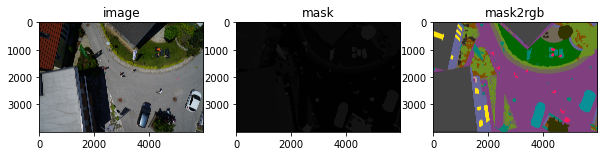

In [22]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(10,5))
        
ax1.set_title('image')
ax1.imshow(img)
ax2.set_title('mask')
ax2.imshow(msk_arr)
ax3.set_title('mask2rgb')
ax3.imshow(rgb_msk)

In [23]:
def mask2rgb(mask, df):
  """
  method to convert segmented mask to rgb given a
  dataframe with RGB values for each class in mask
  """
  rgb_msk = np.zeros_like(mask)
  for idx, row in df.iterrows():
    rgb_msk[(mask[:,:,0]==idx)&
            (mask[:,:,1]==idx)&
            (mask[:,:,2]==idx)] = row.values[1:].astype(int)
  return rgb_msk

In [24]:
rgb_msk = mask2rgb(msk_arr, class_annots)

In [25]:
def show_img_msk(image, mask, convert_mask=False, df=None):
  """
  method to display an image alongside
  its mask
  """
  if convert_mask:
    assert df is not None
    mask = mask2rgb(mask, df)
  fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,5))
  ax1.set_title('image')
  ax1.imshow(image)
  ax1.axis('off')
  
  ax2.set_title('mask')
  ax2.imshow(mask)
  ax2.axis('off')
  fig.tight_layout()

In [26]:
# show_img_msk(img, msk_arr)

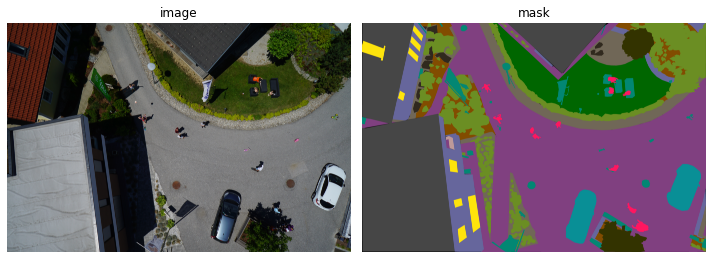

In [27]:
show_img_msk(img, msk_arr, convert_mask=True, df=class_annots)

# Some Common Imports

In [28]:
import torch 
import pandas as pd
from tqdm import tqdm
import albumentations as A

# Augmentation Functions

albumentation documentation : https://albumentations.ai/docs/

In [29]:
def train_augs(h=512, w=512):
  return A.Compose([
                    A.ShiftScaleRotate(),
                    A.RandomBrightnessContrast(),
                    A.Resize(height=h, width=w),
                    A.ToFloat(),
  ])

def valid_augs(h=512, w=512):
  return A.Compose([
                    A.Resize(height=h, width=w),
                    A.ToFloat(),
  ])

In [30]:
img_arr.shape

(4000, 6000, 3)

In [31]:
aug_data = train_augs()(image=img_arr, mask=msk_arr)
image = aug_data['image']
mask = aug_data['mask']

In [32]:
image.shape, mask.shape

((512, 512, 3), (512, 512, 3))

In [33]:
rgb_msk = mask2rgb(mask, class_annots)

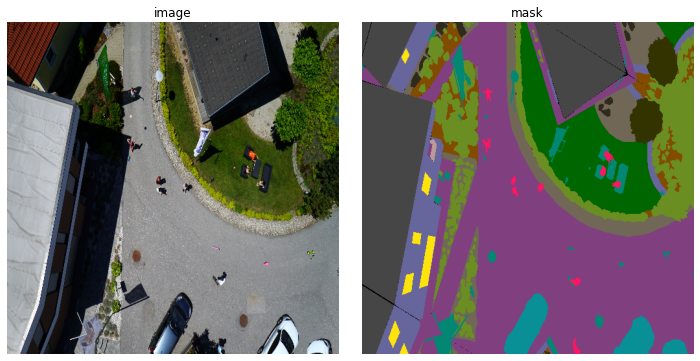

In [34]:
show_img_msk(image, mask, convert_mask=True, df=class_annots)

In [35]:
mask.shape

(512, 512, 3)

# Create Custom Dataset 

Make a collection with the image and mask paths.

In [36]:
def get_file_path(idx, imgs_pth, msks_pth):
  img_stem = os.listdir(imgs_pth)[idx][:-4] # filename
  # make paths
  img_ = imgs_pth/(img_stem+'.jpg')
  msk_ = msks_pth/(img_stem+'.png')
  return img_stem, img_, msk_

In [37]:
get_file_path(10, imgs_pth, msks_pth)

('398',
 PosixPath('/content/dataset/semantic_drone_dataset/original_images/398.jpg'),
 PosixPath('/content/dataset/semantic_drone_dataset/label_images_semantic/398.png'))

In [38]:
! ls /content/dataset/semantic_drone_dataset/label_images_semantic/| wc

    400     400    3200


In [39]:
paths = [get_file_path(idx, imgs_pth, msks_pth) for idx in range(400)]

In [40]:
paths_df = pd.DataFrame(paths, columns=['stem', 'img', 'msk'])

In [41]:
from sklearn.model_selection import train_test_split

In [42]:
train_df, valid_df = train_test_split(paths_df)

In [43]:
len(train_df), len(valid_df)

(300, 100)

In [44]:
train_df.head()

,stem,img,msk
381,068,/content/dataset/semantic_drone_dataset/origin...,/content/dataset/semantic_drone_dataset/label_...
34,585,/content/dataset/semantic_drone_dataset/origin...,/content/dataset/semantic_drone_dataset/label_...
22,540,/content/dataset/semantic_drone_dataset/origin...,/content/dataset/semantic_drone_dataset/label_...
35,545,/content/dataset/semantic_drone_dataset/origin...,/content/dataset/semantic_drone_dataset/label_...
318,356,/content/dataset/semantic_drone_dataset/origin...,/content/dataset/semantic_drone_dataset/label_...


In [45]:
class DroneDataset(torch.utils.data.Dataset):
  def __init__(self, df, augs=None, seg_df=None, show_after=False, make_tensor=True):
    super(DroneDataset, self).__init__()
    self.df = df
    self.augs = augs() if augs is not None else False
    # misc kwargs
    self.show = show_after
    self.make_tensor = make_tensor
    self.seg_df = seg_df

  def __getitem__(self, idx):
    # get paths
    img_ = self.df.iloc[idx].img
    msk_ = self.df.iloc[idx].msk
    # get arrays
    img = np.asarray(Image.open(img_).convert('RGB'))
    msk = np.asarray(Image.open(msk_).convert('RGB'))
    if self.augs:
      aug_data = self.augs(image=img, mask=msk)
      img = aug_data['image']
      msk = aug_data['mask']
    if self.show:
      show_img_msk(img, msk, convert_mask=True, df=self.seg_df)
    if self.make_tensor:
      img, msk = torch.Tensor(img).permute(2,0,1), torch.Tensor(msk[...,0]).unsqueeze(0)
    return img, msk

  def __len__(self):
    return len(self.df)

In [46]:
train_ds = DroneDataset(train_df, seg_df = class_annots, augs=train_augs, show_after=True)

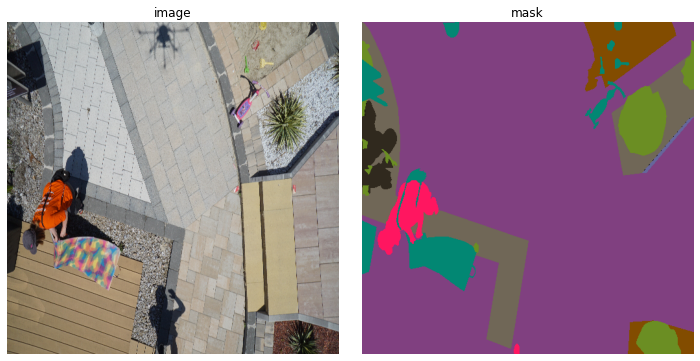

In [47]:
image, mask = train_ds[10]

In [48]:
image.shape, mask.shape

(torch.Size([3, 512, 512]), torch.Size([1, 512, 512]))

# Make mask proper
Have to make a mask of shape `B, 24, H, W`

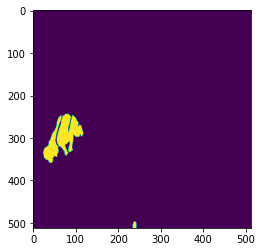

In [49]:
plt.imshow((mask[0] == 15).float())

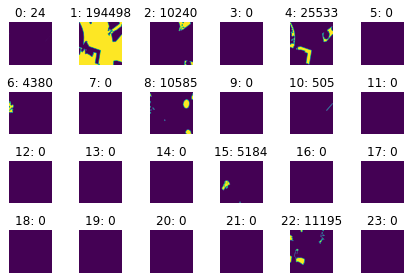

In [50]:
for idx in class_annots.index:
  plt.subplot(4, 6, idx+1)
  plt.axis('off')
  plt.tight_layout()
  filtered = (mask[0] == idx).float()
  plt.imshow(filtered)
  plt.title(f'{idx}: {filtered.sum().int()}')
plt.show()

In [51]:
def separate_masks(mask, seg_df, dim=0):
  """
  To separate the class segmentations into different channels
  so as to work with DiceLoss and to make it sort of a binary problem for each class
  """
  m = []
  for idx in seg_df.index:
    m.append((mask[0] == idx).float())
  return torch.stack(m, dim)

In [52]:
mask_sep = separate_masks(mask, seg_df=class_annots)
mask_sep.shape

torch.Size([24, 512, 512])

In [53]:
class DroneDataset(torch.utils.data.Dataset):
  def __init__(self, df, augs=None, seg_df=None, show_after=False, make_tensor=True):
    super(DroneDataset, self).__init__()
    self.df = df
    self.augs = augs() if augs is not None else False
    # misc kwargs
    self.show = show_after
    self.make_tensor = make_tensor
    self.seg_df = seg_df

  def __getitem__(self, idx):
    # get paths
    img_ = self.df.iloc[idx].img
    msk_ = self.df.iloc[idx].msk
    # get arrays
    img = np.asarray(Image.open(img_).convert('RGB'))
    msk = np.asarray(Image.open(msk_).convert('RGB'))
    if self.augs:
      aug_data = self.augs(image=img, mask=msk)
      img = aug_data['image']
      msk = aug_data['mask']
    if self.show:
      show_img_msk(img, msk, convert_mask=True, df=self.seg_df)
    if self.make_tensor:
      img = torch.Tensor(img).permute(2,0,1)
      msk = torch.Tensor(msk[...,0]).unsqueeze(0)  # 3, H, W -> 1, H, W
      # use only one axis (since same info repeated in all 3 channels)
      # msk = separate_masks(msk, seg_df=self.seg_df) # 1, H, W -> 24, H, W
    return img, msk

  def __len__(self):
    return len(self.df)

In [54]:
train_ds = DroneDataset(train_df, seg_df = class_annots, augs=train_augs)
valid_ds = DroneDataset(valid_df, seg_df = class_annots, augs=valid_augs)

In [55]:
image, mask = train_ds[0]

In [56]:
image.shape, mask.shape

(torch.Size([3, 512, 512]), torch.Size([1, 512, 512]))

# Get back the multilabel mask

In [57]:
def join_masks(mask, seg_df):
  """
  To join the binary labelled segmentations into a single channel
  """
  m = []
  for idx in seg_df.index:
    m.append((mask[idx]*idx)) 
  return torch.stack(m, -1).sum(-1) #.unsqueeze(0).permute(1,2,0) # make correct shape

In [58]:
#joined = join_masks(mask, class_annots)
#joined.shape

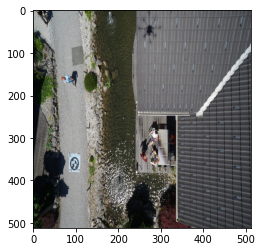

In [59]:
plt.imshow(image.permute(1,2,0).cpu())

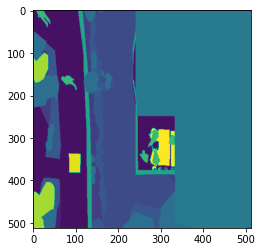

In [60]:
plt.imshow(mask.squeeze())

# Task 5 : Load dataset into batches

In [61]:
train_dl = torch.utils.data.DataLoader(train_ds, shuffle=True, batch_size=2)
valid_dl = torch.utils.data.DataLoader(valid_ds, shuffle=True, batch_size=2)

In [62]:
for images, masks in train_dl:
  break

In [63]:
images.shape

torch.Size([2, 3, 512, 512])

In [64]:
masks.shape

torch.Size([2, 1, 512, 512])

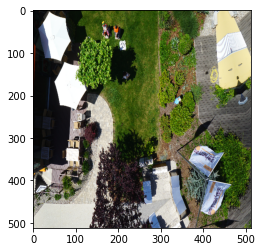

In [65]:
plt.imshow(images[0].permute(1,2,0).cpu())

In [66]:
# join_masks(masks[0], class_annots).shape

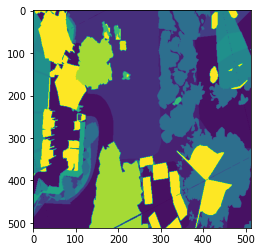

In [67]:
plt.imshow(masks[0].squeeze())

In [68]:
import matplotlib
from matplotlib import cm
from matplotlib.colors import ListedColormap

In [69]:
def get_seg_kwargs(seg_df, name_column='name', columns=None, nbits=8., ofs=0.5):
  """
  method to read the seg_df and get proper colormaps and colorbars that work 
  with matplotlib
  """
  columns = ['red','green', 'blue'] if columns is None else columns
  max_val = 2**nbits
  given_colors = seg_df[columns].values
  given_names = class_annots[name_column].values
  n_cls = len(given_names)
  # norm the pixel values
  given_cnorm = given_colors/max_val
  # make cmap
  cmap = ListedColormap(np.hstack((given_cnorm, np.ones((n_cls,1)))))
  # make cbar
  # set boundaries that set which class each value belongs to
  norm = matplotlib.colors.BoundaryNorm(np.arange(0, n_cls), n_cls-1)
  # fmt(10) to fmt(10.99) will return 'wall'
  fmt = matplotlib.ticker.FuncFormatter(lambda x, pos: given_names[norm(x)])
  # set tick positions, pass kwargs for colorbar
  cbar_kw = dict(ticks=np.arange(ofs, n_cls+ofs), format=fmt, 
                 spacing='proportional', orientation='vertical')
  cmap_kw = dict(cmap=cmap, vmin=0, vmax=n_cls-1)
  return cbar_kw, cmap_kw

In [70]:
cbar_kw, cmap_kw = get_seg_kwargs(class_annots)

In [71]:
mask[0].shape

torch.Size([512, 512])

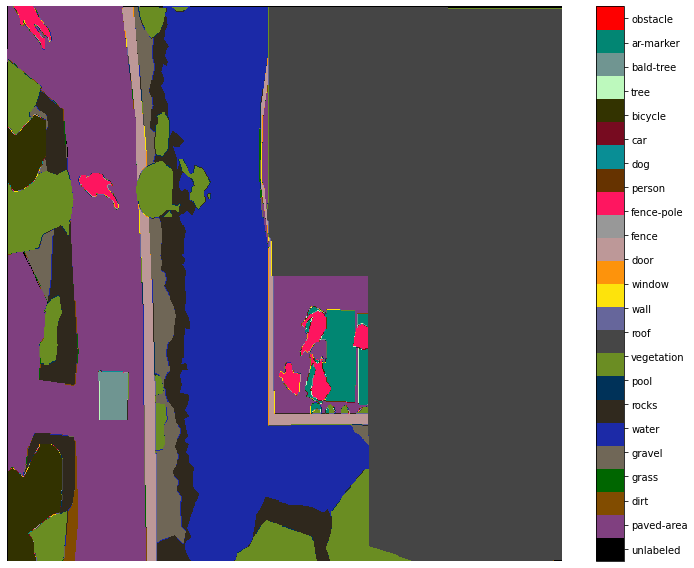

In [72]:
fig=plt.figure(figsize=(10,8))
fig.add_subplot(1, 1, 1)
plt.axis('off')
ax = plt.gca()
im = plt.imshow(mask[0].squeeze(), **cmap_kw)
ax.figure.colorbar(im, ax=ax, **cbar_kw)
plt.tight_layout()


In [73]:
bool(1)

True

In [74]:
def show_batch(images, seg_df, masks=None, preds=None, cbar=True, limit=None):
  """
  convert the masks to single channel and show the input and masks of a single batch
  """
  bs = len(images) if limit is None else limit
  data = [images, masks, preds]
  check_none = [True if v is not None else False for v in data]
  cbar_kw, cmap_kw = get_seg_kwargs(seg_df)
  n_cols = sum(check_none)
  assert n_cols>1, "both masks=None and preds=None!"
  for b in range(bs):
    fig, axs = plt.subplots(1, n_cols, figsize=(10,8), sharex=False, sharey=True)
    p=0 # to set the col index
    for i, ch in enumerate(check_none):
      if not ch:
        p=1
        continue
      cmap_kwargs = {} if i==0 else cmap_kw
      axs[p].axis('off')
      # only permute for image
      data_arr = data[i][b].permute(1,2,0).cpu() if i==0 else data[i][b].cpu()
      im = axs[p].imshow(data_arr.squeeze(), **cmap_kwargs)
      if cbar and i>1:
        # only for preds, add an axis
        plt.title('preds')
        cax = fig.add_axes([axs[p].get_position().x0+0.05,
                            axs[p].get_position().y0,
                            axs[p].get_position().width,
                            axs[p].get_position().height])
        cax.axis('off') 
        axs[p].figure.colorbar(im, ax=cax, **cbar_kw)
      p+=1
  plt.show()

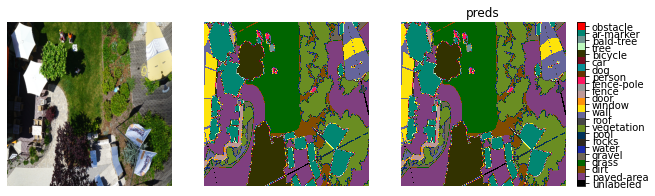

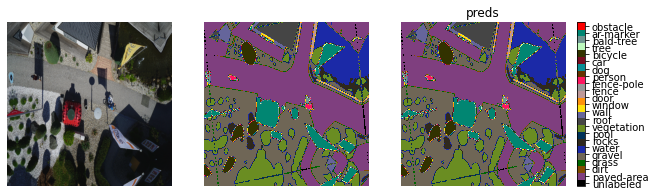

In [75]:
show_batch(images, class_annots, preds=masks, masks=masks, cbar=True, limit=2)

# Task 6 : Create Segmentation Model

segmentation_models_pytorch documentation : https://smp.readthedocs.io/en/latest/

In [76]:
# ! pip install git+https://github.com/qubvel/segmentation_models.pytorch

In [77]:
import segmentation_models_pytorch as smp

In [78]:
smp.__version__

'0.2.1'

In [79]:
from torch import nn

In [80]:
class SegmentationModel(nn.Module):
  def __init__(self):
    super(SegmentationModel, self).__init__()
    self.unet = smp.Unet(
        encoder_name='efficientnet-b0',
        encoder_weights='imagenet',
        in_channels=3,
        classes=24,
        activation=None,
        )
  def forward(self, x):
    acts = self.unet(x)
    return acts

In [81]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

In [82]:
model = SegmentationModel().to(device)

Downloading: "https://github.com/lukemelas/EfficientNet-PyTorch/releases/download/1.0/efficientnet-b0-355c32eb.pth" to /root/.cache/torch/hub/checkpoints/efficientnet-b0-355c32eb.pth


  0%|          | 0.00/20.4M [00:00<?, ?B/s]

In [83]:
masks=masks.to(device)

In [84]:
acts = model(images.to(device))

In [85]:
acts.shape

torch.Size([2, 24, 512, 512])

In [86]:
torch.softmax(acts, dim=1).shape

torch.Size([2, 24, 512, 512])

# Make preds

In [87]:
preds = torch.softmax(acts, dim=1).argmax(dim=1, keepdim=True)
preds.shape

torch.Size([2, 1, 512, 512])

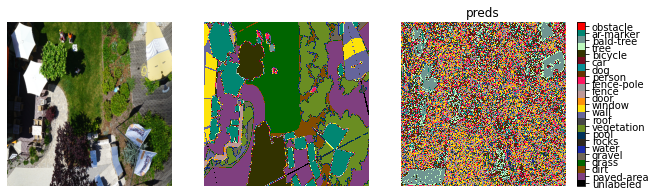

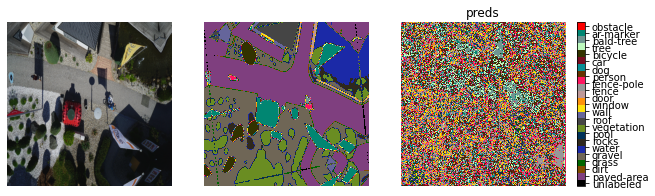

In [88]:
show_batch(images, class_annots, masks=masks, preds=preds, limit=2)

# Pixel Accuracy

In [89]:
masks.shape, preds.shape

(torch.Size([2, 1, 512, 512]), torch.Size([2, 1, 512, 512]))

In [90]:
torch.eq(masks, preds).float().mean()

tensor(0.0229, device='cuda:0')

# IOU for mask and pred

In [91]:
masks.shape, preds.shape 

(torch.Size([2, 1, 512, 512]), torch.Size([2, 1, 512, 512]))

In [92]:
def mIoU(preds, mask, smooth=1e-10, n_classes=24):
    iou_per_class = []
    for cls in range(0, n_classes): #loop per pixel class
        true_class = preds == cls
        true_label = mask == cls

        if true_label.long().sum().item() == 0: 
            # no true label in this loop
            iou_per_class.append(np.nan)
        else:
            intersect = torch.logical_and(true_class, true_label).sum().float().item()
            union = torch.logical_or(true_class, true_label).sum().float().item()

            iou = (intersect + smooth) / (union +smooth)
            iou_per_class.append(iou)
    return np.nanmean(iou_per_class).round(8)

In [93]:
mIoU(preds, masks)

0.00928599

# Loss functions for class

In [94]:
nn.CrossEntropyLoss()(acts, masks.squeeze().long())

tensor(3.4176, device='cuda:0', grad_fn=<NllLoss2DBackward0>)

In [95]:
acts.size(), masks.size()

(torch.Size([2, 24, 512, 512]), torch.Size([2, 1, 512, 512]))

In [96]:
separate_masks(masks[0], class_annots, dim=0).shape

torch.Size([24, 512, 512])

In [97]:
# acts[0].unsqueeze(0)[0]

In [98]:
def dice_loss(acts, masks, seg_df):
  """
  perform DiceLoss for each item in batch separately
  make use of DiceLoss in binary mode after splitting target masks 
  into binary labels making n_cls channels
  acts for each class is already available in n_cls channles
  """
  bs = len(acts)
  l = 0.0
  for b in range(bs):
    m = separate_masks(masks[b], seg_df, dim=0).unsqueeze(0)
    a = acts[b].unsqueeze(0)
    # m: [1, n_cls, h, w]
    # a: [1, n_cls, h, w]
    l += smp.losses.DiceLoss(mode='binary')(a, m) 
  return l/bs

In [99]:
dice_loss(acts, masks, class_annots)

tensor(0.9250, device='cuda:0', grad_fn=<DivBackward0>)

In [100]:
def loss_func(acts, masks):
  loss1 = dice_loss(acts, masks, class_annots) # segmentation
  loss2 = nn.CrossEntropyLoss()(acts, masks.squeeze().long()) # classifier
  return loss1 + loss2

In [101]:
loss_func(acts, masks)

tensor(4.3426, device='cuda:0', grad_fn=<AddBackward0>)

## Show preds

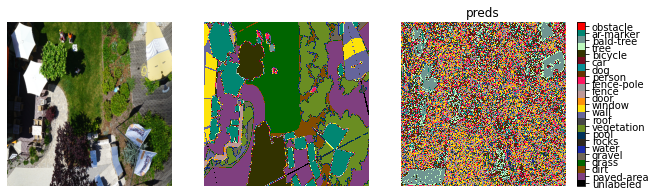

In [102]:
show_batch(images, class_annots, masks=masks, preds=preds, limit=1)

(-0.5, 511.5, 511.5, -0.5)

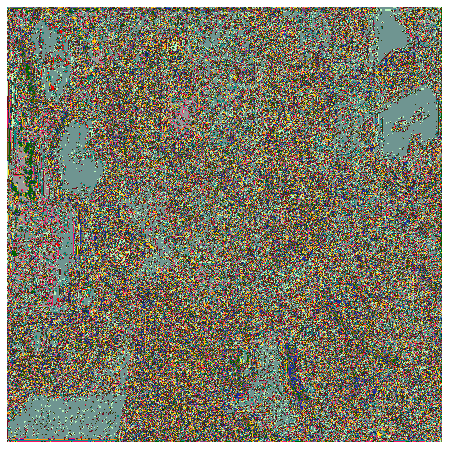

In [103]:
plt.figure(figsize=(10,8))
plt.imshow(preds[0][0].cpu(), **cmap_kw)
plt.axis('off')

# Optimizer

In [104]:
optim = torch.optim.Adam(model.parameters(), lr=3e-3)
optim

Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    eps: 1e-08
    lr: 0.003
    weight_decay: 0
)

Create Train and Validation Function 

In [105]:
@torch.no_grad()
def validate_epoch(valid_dl, loss_func, show=True):
  model.eval()
  l_valid = len(valid_dl)
  valid_loss = 0.0
  valid_acc = 0.0 # pixel accuracy
  valid_iou = 0.0 # iou
  for vb, (images, masks) in enumerate(tqdm(valid_dl)):
    images = images.to(device)
    masks = masks.to(device)
    acts = model(images)
    loss = loss_func(acts, masks)
    valid_loss += loss.item()
    preds = torch.softmax(acts, dim=1).argmax(dim=1, keepdim=True)
    valid_iou += mIoU(preds, masks)
    valid_acc += torch.eq(preds, masks).float().mean().item()
  tqdm.write(f'valid_iou:{(valid_iou/l_valid):.4f} valid_acc:{(valid_acc/l_valid):.4f} valid_loss:{(valid_loss/l_valid):.4f}')
  if show:
    show_batch(images, class_annots, masks=masks, preds=preds, limit=2)

In [106]:
# validate_epoch(valid_dl, loss_func)

In [107]:
def train(epochs, train_dl, valid_dl, loss_func, show=True, val_every=2):
  for e in range(epochs):
    print(f'epoch {e}')
    model.train()
    train_loss = 0.0
    train_acc = 0.0
    train_iou = 0.0
    l_train = len(train_dl)
    for tb, (images, masks) in enumerate(tqdm(train_dl)):
      images = images.to(device)
      masks = masks.to(device)
      acts = model(images)
      # opt
      optim.zero_grad()
      # loss
      loss = loss_func(acts, masks)
      train_loss += loss.item()
      loss.backward()
      optim.step()
      # preds train
      preds = torch.softmax(acts, dim=1).argmax(dim=1, keepdim=True)
      train_iou += mIoU(preds, masks)
      train_acc += torch.eq(preds, masks).float().mean().item()
    
    tqdm.write(f'train_iou:{(train_iou/l_train):.4f} train_acc:{(train_acc/l_train):.4f} train_loss:{(train_loss/l_train):.4f}')
    if e%val_every==0:
      # validate every 2 epochs
      validate_epoch(valid_dl, loss_func, show=show)
    

In [108]:
train_dl = torch.utils.data.DataLoader(train_ds, shuffle=True, batch_size=4)
valid_dl = torch.utils.data.DataLoader(valid_ds, shuffle=True, batch_size=4)

epoch 0


100%|██████████| 150/150 [06:46<00:00,  2.71s/it]


train_iou:0.1107 train_acc:0.5435 train_loss:2.2967


100%|██████████| 50/50 [01:23<00:00,  1.67s/it]


valid_iou:0.0556 valid_acc:0.4360 valid_loss:3.0947


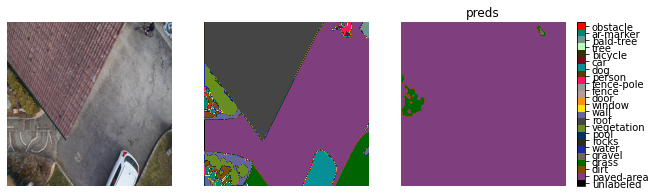

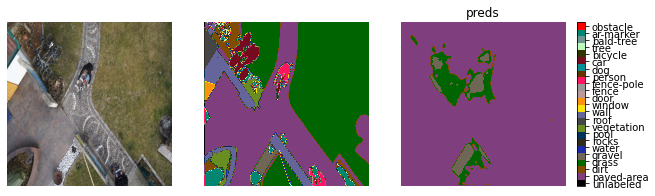

epoch 1


100%|██████████| 150/150 [06:46<00:00,  2.71s/it]


train_iou:0.1473 train_acc:0.6026 train_loss:1.8888
epoch 2


100%|██████████| 150/150 [06:50<00:00,  2.73s/it]


train_iou:0.1599 train_acc:0.6162 train_loss:1.8069


100%|██████████| 50/50 [01:24<00:00,  1.70s/it]


valid_iou:0.1519 valid_acc:0.6405 valid_loss:1.7221


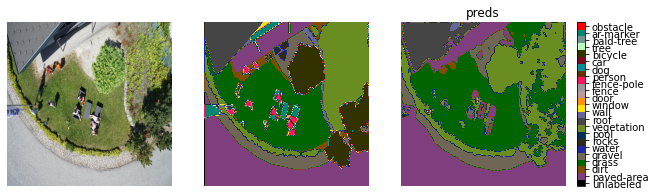

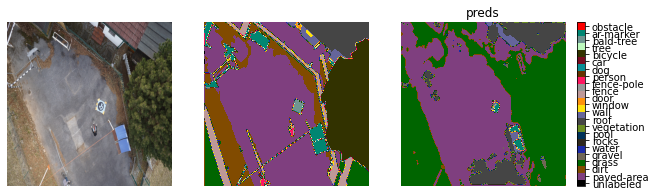

epoch 3


100%|██████████| 150/150 [06:50<00:00,  2.73s/it]


train_iou:0.1767 train_acc:0.6445 train_loss:1.6860
epoch 4


100%|██████████| 150/150 [06:47<00:00,  2.72s/it]


train_iou:0.1886 train_acc:0.6558 train_loss:1.6132


100%|██████████| 50/50 [01:23<00:00,  1.67s/it]


valid_iou:0.1864 valid_acc:0.6575 valid_loss:1.5867


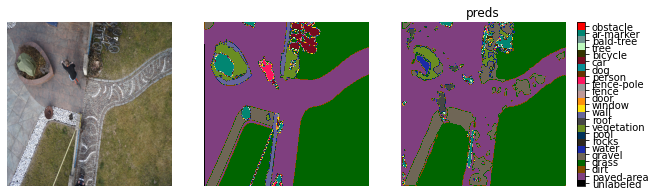

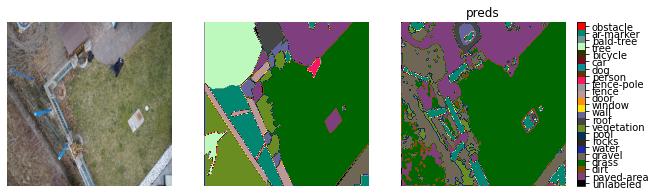

epoch 5


100%|██████████| 150/150 [06:46<00:00,  2.71s/it]


train_iou:0.1995 train_acc:0.6798 train_loss:1.5207
epoch 6


100%|██████████| 150/150 [06:38<00:00,  2.66s/it]


train_iou:0.1971 train_acc:0.6751 train_loss:1.5586


100%|██████████| 50/50 [01:21<00:00,  1.63s/it]


valid_iou:0.2153 valid_acc:0.7007 valid_loss:1.4247


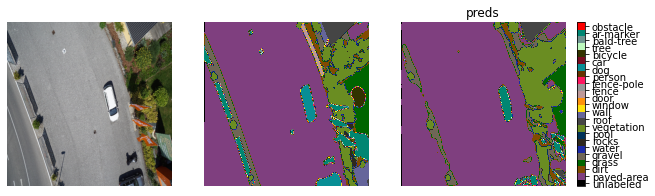

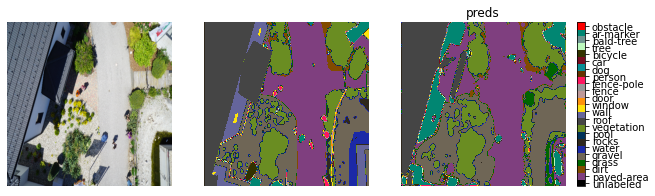

epoch 7


100%|██████████| 150/150 [06:45<00:00,  2.70s/it]


train_iou:0.2026 train_acc:0.6899 train_loss:1.4865
epoch 8


100%|██████████| 150/150 [06:37<00:00,  2.65s/it]


train_iou:0.2031 train_acc:0.6818 train_loss:1.4999


100%|██████████| 50/50 [01:22<00:00,  1.66s/it]


valid_iou:0.2378 valid_acc:0.7060 valid_loss:1.4009


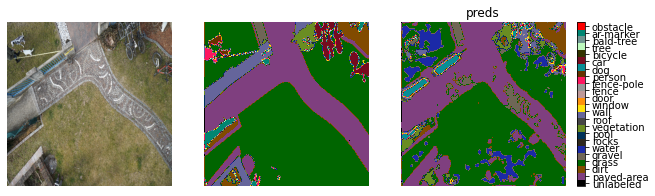

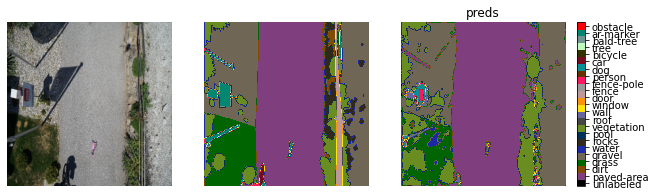

epoch 9


100%|██████████| 150/150 [06:37<00:00,  2.65s/it]


train_iou:0.2223 train_acc:0.7279 train_loss:1.3248
epoch 10


100%|██████████| 150/150 [06:52<00:00,  2.75s/it]


train_iou:0.2226 train_acc:0.7244 train_loss:1.3313


100%|██████████| 50/50 [01:24<00:00,  1.69s/it]


valid_iou:0.2392 valid_acc:0.6910 valid_loss:1.4617


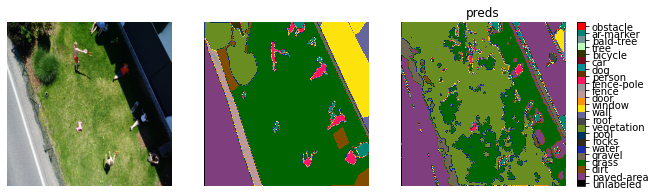

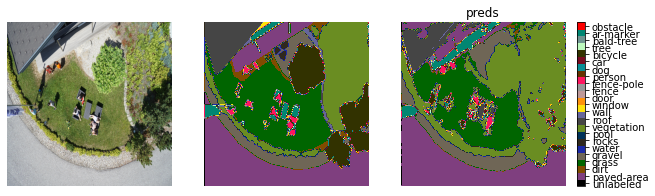

epoch 11


100%|██████████| 150/150 [06:37<00:00,  2.65s/it]


train_iou:0.2267 train_acc:0.7348 train_loss:1.2650
epoch 12


100%|██████████| 150/150 [06:46<00:00,  2.71s/it]


train_iou:0.2310 train_acc:0.7396 train_loss:1.2584


100%|██████████| 50/50 [01:23<00:00,  1.67s/it]


valid_iou:0.2438 valid_acc:0.6943 valid_loss:1.4546


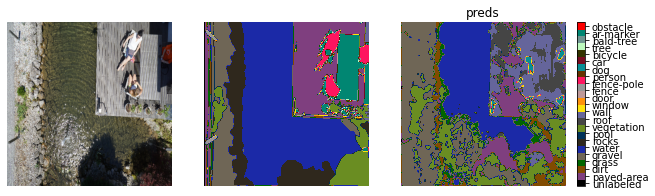

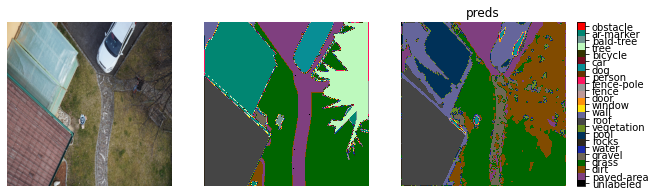

epoch 13


100%|██████████| 150/150 [06:48<00:00,  2.72s/it]


train_iou:0.2263 train_acc:0.7336 train_loss:1.2664
epoch 14


 15%|█▍        | 22/150 [00:56<05:11,  2.43s/it]

In [ ]:
train(15, train_dl, valid_dl, loss_func, val_every=2)

100%|██████████| 50/50 [01:22<00:00,  1.66s/it]


valid_iou:0.2233 valid_acc:0.6375 valid_loss:1.6431


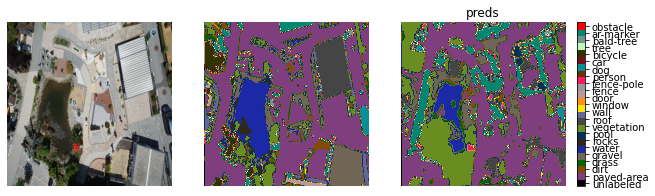

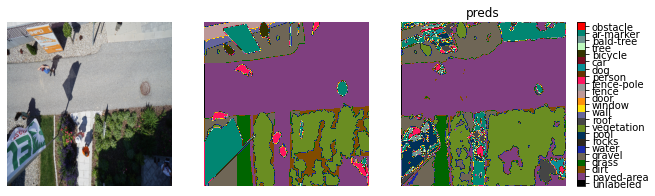

In [138]:
validate_epoch(valid_dl, loss_func, show=True)

# Inference

In [111]:
class DroneInfDataset(torch.utils.data.Dataset):
  def __init__(self, df, seg_df=None, augs=None, make_tensor=True):
    super(DroneInfDataset, self).__init__()
    self.df = df
    self.augs = augs() if augs is not None else False
    # misc kwargs
    self.make_tensor = make_tensor
    self.seg_df = seg_df

  def __getitem__(self, idx):
    # get paths
    img_ = self.df.iloc[idx].img
    # get arrays
    img = np.asarray(Image.open(img_).convert('RGB'))
    msk = np.array([0.0])
    if self.augs:
      aug_img = self.augs(image=img)
      img = aug_img['image']
    if self.make_tensor:
      img = torch.Tensor(img).permute(2,0,1)
      msk = torch.Tensor(msk).unsqueeze(0)
    return img, msk

  def __len__(self):
    return len(self.df)

In [112]:
# valid_df, replace with test_df if available 
test_ds = DroneInfDataset(valid_df, seg_df=class_annots, augs=valid_augs)

In [113]:
# test_ds[0]

In [114]:
test_dl = torch.utils.data.DataLoader(test_ds, shuffle=False, batch_size=4)

In [115]:
@torch.no_grad()
def inference(test_dl, seg_df, show=True, dim=0):
  model.eval()
  p = []
  for vb, (images, _) in enumerate(tqdm(test_dl)):
    images = images.to(device)
    acts = model(images)
    preds = torch.softmax(acts, dim=1).argmax(dim=1, keepdim=True)
    p.append(preds)
    if show:
      show_batch(images, seg_df, preds=preds, limit=1)
  return torch.stack(p, dim=dim)

  0%|          | 0/25 [00:00<?, ?it/s]

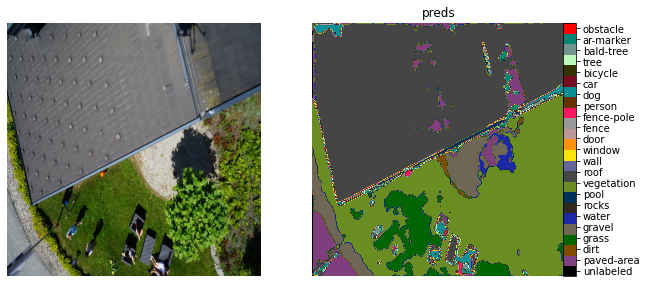

  4%|▍         | 1/25 [00:02<01:09,  2.91s/it]

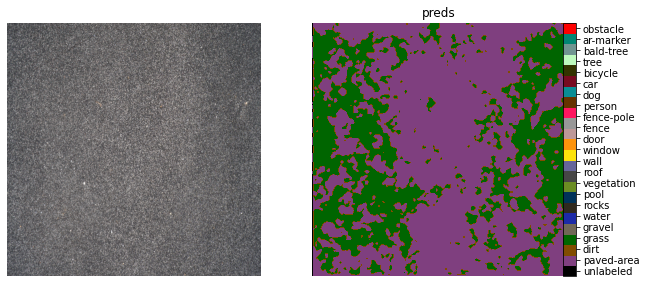

  8%|▊         | 2/25 [00:05<01:07,  2.92s/it]

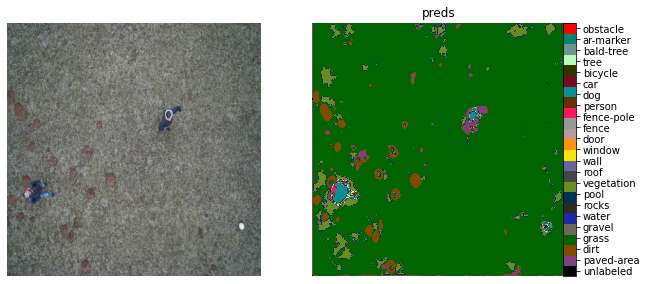

 12%|█▏        | 3/25 [00:08<01:05,  2.98s/it]

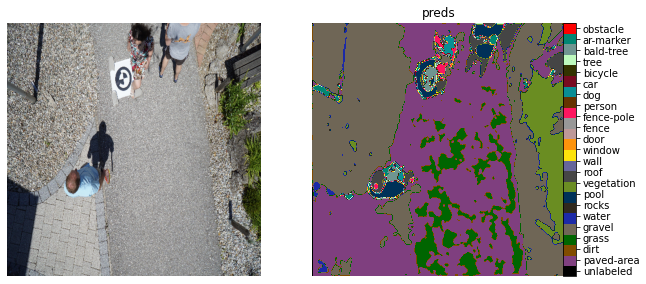

 16%|█▌        | 4/25 [00:11<01:01,  2.92s/it]

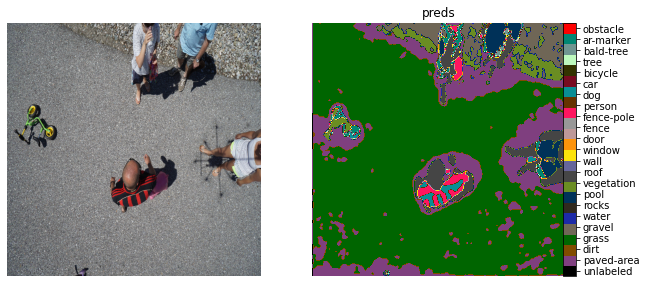

 20%|██        | 5/25 [00:14<00:57,  2.88s/it]

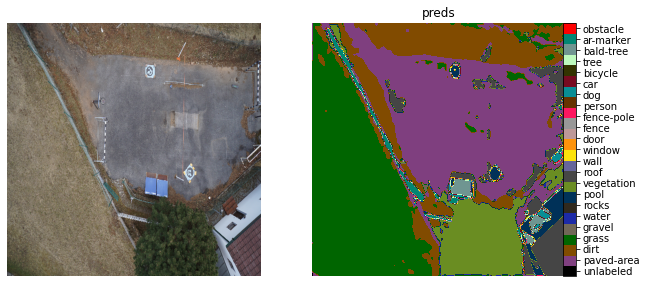

 24%|██▍       | 6/25 [00:17<00:54,  2.86s/it]

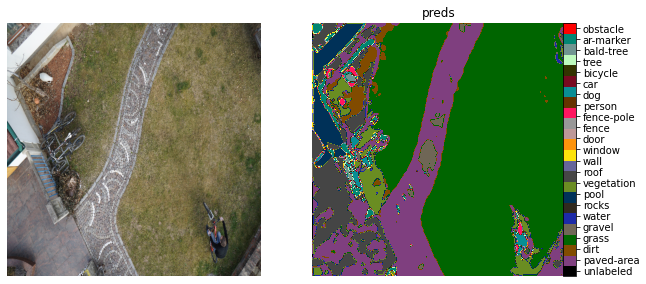

 28%|██▊       | 7/25 [00:20<00:51,  2.85s/it]

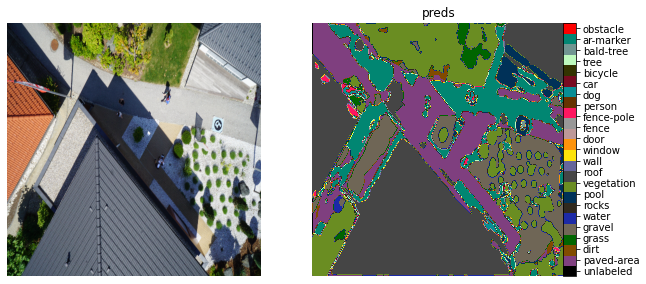

 32%|███▏      | 8/25 [00:23<00:48,  2.86s/it]

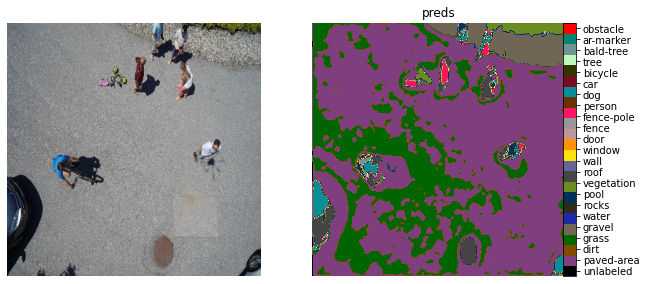

 36%|███▌      | 9/25 [00:25<00:45,  2.85s/it]

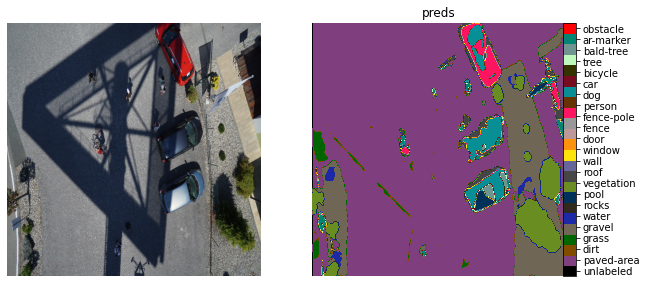

 40%|████      | 10/25 [00:28<00:42,  2.84s/it]

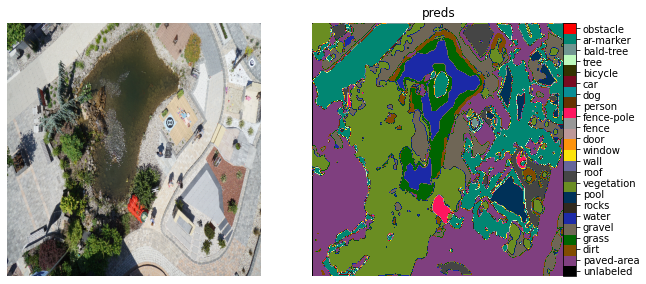

 44%|████▍     | 11/25 [00:31<00:40,  2.91s/it]

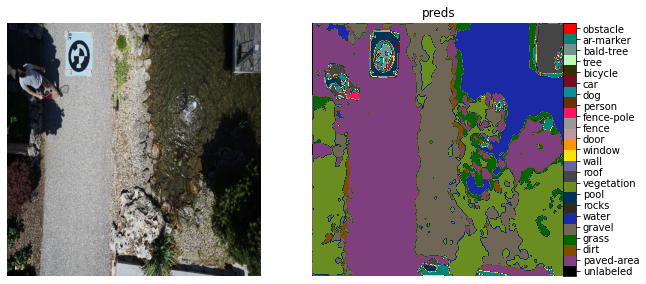

 48%|████▊     | 12/25 [00:34<00:37,  2.88s/it]

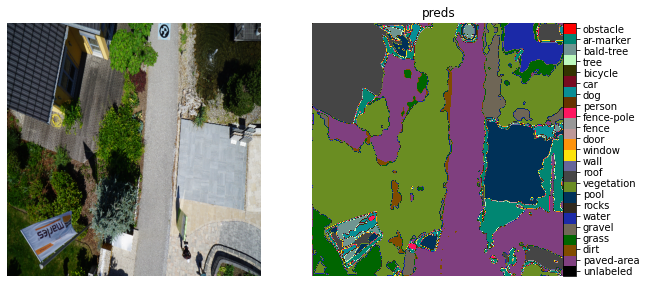

 52%|█████▏    | 13/25 [00:37<00:34,  2.85s/it]

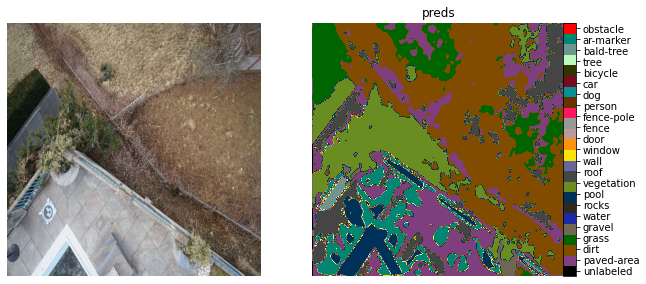

 56%|█████▌    | 14/25 [00:40<00:31,  2.83s/it]

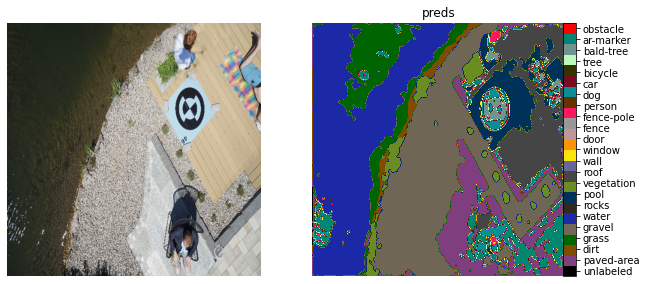

 60%|██████    | 15/25 [00:43<00:28,  2.85s/it]

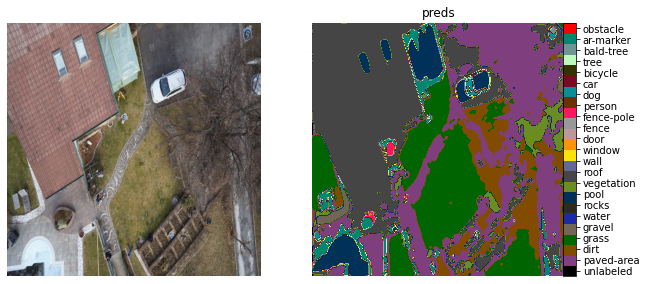

 64%|██████▍   | 16/25 [00:45<00:25,  2.85s/it]

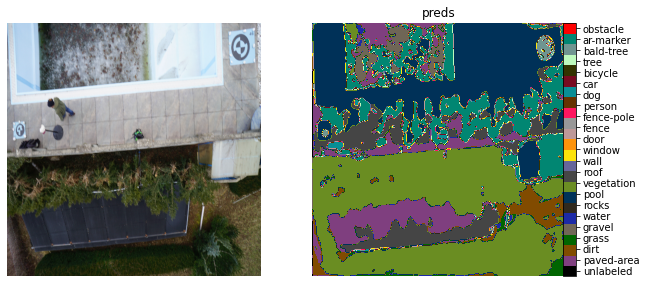

 68%|██████▊   | 17/25 [00:48<00:22,  2.85s/it]

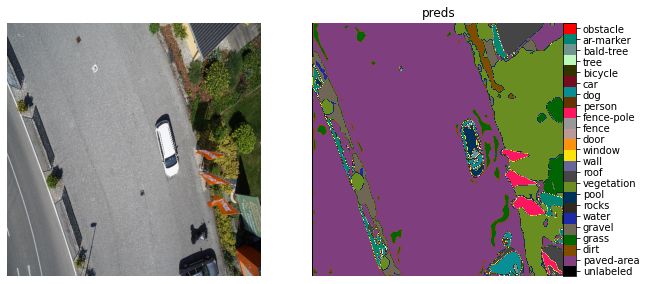

 72%|███████▏  | 18/25 [00:51<00:20,  2.88s/it]

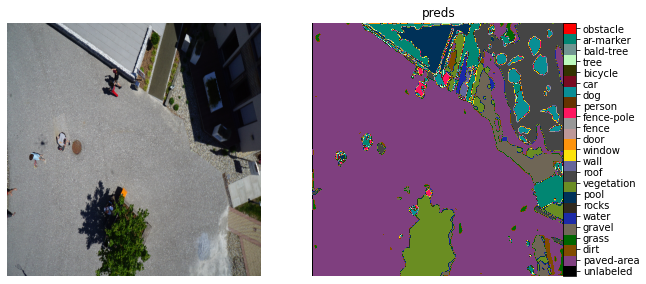

 76%|███████▌  | 19/25 [00:54<00:17,  2.93s/it]

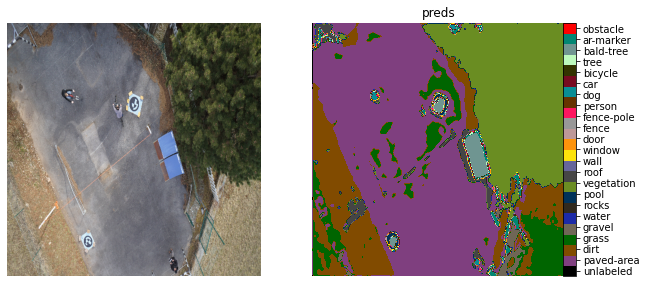

 80%|████████  | 20/25 [00:57<00:14,  2.92s/it]

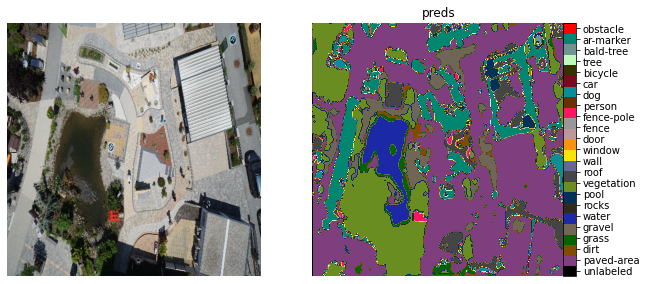

 84%|████████▍ | 21/25 [01:00<00:11,  2.90s/it]

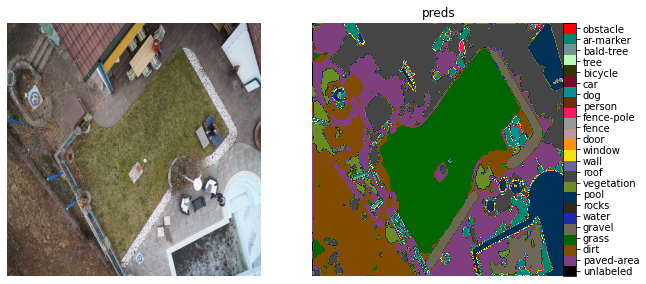

 88%|████████▊ | 22/25 [01:03<00:08,  2.87s/it]

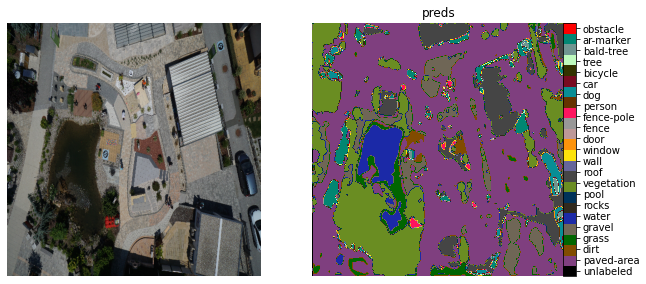

 92%|█████████▏| 23/25 [01:06<00:05,  2.86s/it]

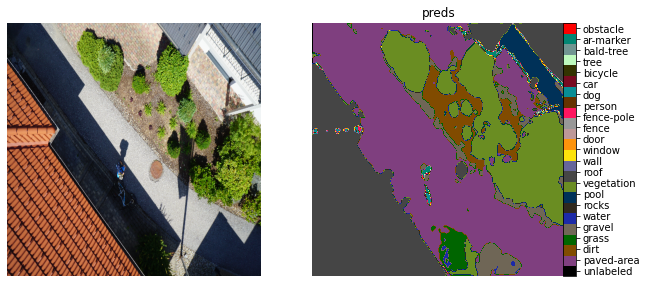

 96%|█████████▌| 24/25 [01:08<00:02,  2.86s/it]

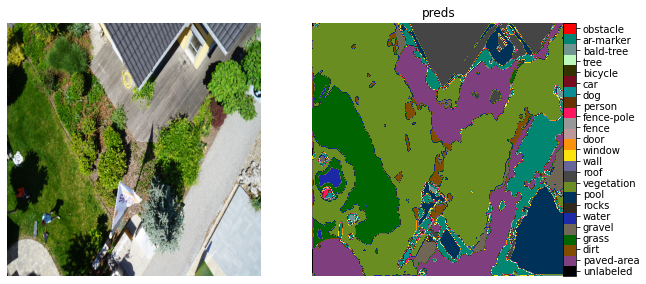

100%|██████████| 25/25 [01:11<00:00,  2.87s/it]


In [116]:
preds = inference(test_dl, class_annots)

In [118]:
all_preds = preds.reshape(-1,512,512).cpu()

In [120]:
all_preds.shape

torch.Size([100, 512, 512])

# Proper colors for each class

Resources used:
- [Create new colormap](https://matplotlib.org/stable/tutorials/colors/colormap-manipulation.html#sphx-glr-tutorials-colors-colormap-manipulation-py)

- [Params for imshow](https://matplotlib.org/stable/api/_as_gen/matplotlib.axes.Axes.imshow.html#matplotlib.axes.Axes.imshow)

- [Displaying heatmaps](https://matplotlib.org/stable/gallery/images_contours_and_fields/image_annotated_heatmap.html#sphx-glr-gallery-images-contours-and-fields-image-annotated-heatmap-py)

- [Available colormaps](https://matplotlib.org/stable/tutorials/colors/colormaps.html)

In [121]:
import matplotlib
from matplotlib import cm
from matplotlib.colors import ListedColormap

In [122]:
given_colors = class_annots[['red','green', 'blue']].values

In [123]:
given_cnorm = given_colors/256.

In [124]:
given_names = class_annots.name.values

In [125]:
n_cls = len(given_names)
norm = matplotlib.colors.BoundaryNorm(np.arange(0, n_cls), n_cls-1)
fmt = matplotlib.ticker.FuncFormatter(lambda x, pos: given_names[norm(x)])

In [126]:
fmt(0.8), n_cls

('unlabeled', 24)

In [127]:
np.arange(0.5, 24.5).shape

(24,)

In [128]:
ofs=0.5
cbar_kw = dict(ticks=np.arange(ofs, n_cls+ofs), format=fmt)
cbar_kw

{'format': <matplotlib.ticker.FuncFormatter at 0x7fbfaabca850>,
 'ticks': array([ 0.5,  1.5,  2.5,  3.5,  4.5,  5.5,  6.5,  7.5,  8.5,  9.5, 10.5,
        11.5, 12.5, 13.5, 14.5, 15.5, 16.5, 17.5, 18.5, 19.5, 20.5, 21.5,
        22.5, 23.5])}

In [129]:
# reds = cm.get_cmap('Reds', n_cls) # like a lambda

In [130]:
# reds.colors

In [131]:
# reds(np.linspace(0,1,n_cls)) # get the norm color values 

In [132]:
given_cnorm.shape, np.ones((24,1)).shape

((24, 3), (24, 1))

In [133]:
# np.hstack((given_cnorm, np.ones((24,1)))) # to match shape of colmap RGBA

In [134]:
given_cmap = ListedColormap(np.hstack((given_cnorm, np.ones((n_cls,1)))))

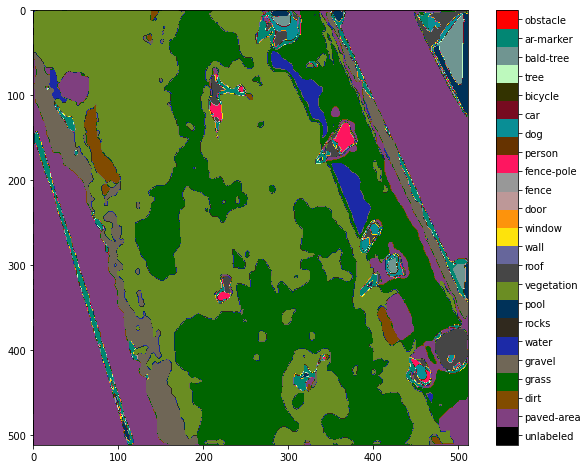

In [137]:
plt.figure(figsize=(10,8))
ax = plt.gca()
im = ax.imshow(all_preds[10], cmap=given_cmap, vmin=0, vmax=n_cls-1)
cbar = ax.figure.colorbar(im, ax=ax, **cbar_kw)